# Spotify Model

# Introduction

Importing the necessary packages.

In [2]:
#Importing the libraries and data
# Importing Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
import seaborn as sns
import plotly.figure_factory as ff
from sklearn.model_selection import train_test_split

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
import warnings
warnings.filterwarnings("ignore")

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [9]:
df=pd.read_csv("/content/drive/MyDrive/Colab Notebooks/data.csv")

In [ ]:
df.head()

,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,valence,year
0,0.991000,['Mamie Smith'],0.598,168333,0.224,0,0cS0A1fUEUd1EW3FcF8AEI,0.000522,5,0.3790,-12.628,0,Keep A Song In Your Soul,12,1920,0.0936,149.976,0.6340,1920
1,0.643000,"[""Screamin' Jay Hawkins""]",0.852,150200,0.517,0,0hbkKFIJm7Z05H8Zl9w30f,0.026400,5,0.0809,-7.261,0,I Put A Spell On You,7,1920-01-05,0.0534,86.889,0.9500,1920
2,0.993000,['Mamie Smith'],0.647,163827,0.186,0,11m7laMUgmOKqI3oYzuhne,0.000018,0,0.5190,-12.098,1,Golfing Papa,4,1920,0.1740,97.600,0.6890,1920
3,0.000173,['Oscar Velazquez'],0.730,422087,0.798,0,19Lc5SfJJ5O1oaxY0fpwfh,0.801000,2,0.1280,-7.311,1,True House Music - Xavier Santos & Carlos Gomi...,17,1920-01-01,0.0425,127.997,0.0422,1920
4,0.295000,['Mixe'],0.704,165224,0.707,1,2hJjbsLCytGsnAHfdsLejp,0.000246,10,0.4020,-6.036,0,Xuniverxe,2,1920-10-01,0.0768,122.076,0.2990,1920


In [ ]:
df.shape

(174389, 19)

In [ ]:
df.describe()

,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo,valence,year
count,174389.000000,174389.000000,1.743890e+05,174389.000000,174389.000000,174389.000000,174389.000000,174389.000000,174389.000000,174389.000000,174389.000000,174389.000000,174389.000000,174389.000000,174389.000000
mean,0.499228,0.536758,2.328100e+05,0.482721,0.068135,0.197252,5.205305,0.211123,-11.750865,0.702384,25.693381,0.105729,117.006500,0.524533,1977.061764
std,0.379936,0.176025,1.483958e+05,0.272685,0.251978,0.334574,3.518292,0.180493,5.691591,0.457211,21.872740,0.182260,30.254178,0.264477,26.907950
min,0.000000,0.000000,4.937000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1920.000000
25%,0.087700,0.414000,1.661330e+05,0.249000,0.000000,0.000000,2.000000,0.099200,-14.908000,0.000000,1.000000,0.035200,93.931000,0.311000,1955.000000
50%,0.517000,0.548000,2.057870e+05,0.465000,0.000000,0.000524,5.000000,0.138000,-10.836000,1.000000,25.000000,0.045500,115.816000,0.536000,1977.000000
75%,0.895000,0.669000,2.657200e+05,0.711000,0.000000,0.252000,8.000000,0.270000,-7.499000,1.000000,42.000000,0.076300,135.011000,0.743000,1999.000000
max,0.996000,0.988000,5.338302e+06,1.000000,1.000000,1.000000,11.000000,1.000000,3.855000,1.000000,100.000000,0.971000,243.507000,1.000000,2021.000000


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 174389 entries, 0 to 174388
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   acousticness      174389 non-null  float64
 1   artists           174389 non-null  object 
 2   danceability      174389 non-null  float64
 3   duration_ms       174389 non-null  int64  
 4   energy            174389 non-null  float64
 5   explicit          174389 non-null  int64  
 6   id                174389 non-null  object 
 7   instrumentalness  174389 non-null  float64
 8   key               174389 non-null  int64  
 9   liveness          174389 non-null  float64
 10  loudness          174389 non-null  float64
 11  mode              174389 non-null  int64  
 12  name              174389 non-null  object 
 13  popularity        174389 non-null  int64  
 14  release_date      174389 non-null  object 
 15  speechiness       174389 non-null  float64
 16  tempo             17

In [ ]:
#To count the missing values in each column
df.isnull().sum()

acousticness        0
artists             0
danceability        0
duration_ms         0
energy              0
explicit            0
id                  0
instrumentalness    0
key                 0
liveness            0
loudness            0
mode                0
name                0
popularity          0
release_date        0
speechiness         0
tempo               0
valence             0
year                0
dtype: int64

# Binning

Using the features Loudness, Popularity, Explicit, Energy and Year, we are adding classification to the numerical value for further EDA. 

In [ ]:
#Binning "Loudness" of song to classify how loud they are

def loud(row):
    m=df['loudness'].median()
    sd=df['loudness'].std()
    if row['loudness']>=m+(1.5*sd):
        return "Extreme"
    elif row['loudness']>=m+(sd):
        return "Very Loud"
    elif row['loudness']>=m+(0.5*sd):
        return "Loud"
    elif row['loudness']>=m-(0.5*sd):
        return "Soft"
    elif row['loudness']>=m-(sd):
        return "Very Soft"
    else:
        return "Mellow"
df['is_loud']=df.apply(lambda row: loud(row), axis=1)
px.pie(data_frame = df, names = 'is_loud', hole = 0.2, title = 'IS LOUD')

In [ ]:
#Binning with "popularity" for classifiaction of songs based on popularity

def func(df):
    if df > 75:
        return 'Very Popular'
    elif df > 50 and df < 76:
        return 'Popular'
    elif df > 25 and df < 51:
        return 'Average'
    else:
        return 'Not popular'
df['isPopular'] = df['popularity'].apply(func)
px.pie(data_frame = df, names = 'isPopular', hole = 0.2, title = 'Popularity')

In [ ]:
#Binning 'explicit' for classification of songs as explicit or not

def func(df):
    if df == 1:
        return 'Yes'
    else:
        return 'No'
df['isExplicit'] = df['explicit'].apply(func)
px.pie(data_frame = df, names = 'isExplicit', hole = 0.2, title = 'Explicit')

In [ ]:
#Eras Of Music

def year(df):
    if df>1920 and df<=1945:
        return "Post-Great War"
    if df>1945 and df<=1970:
        return "Retro"
    if df>1970 and df<=1995:
        return "Modern"
    else:
        return "Post-Modern"
df['era'] = df['year'].apply(year)
px.pie(data_frame = df, names = 'era', hole = 0.2, title = 'Eras of Music')

In [ ]:
#ENERGY

def energy(row):
    if row['energy']>=df['energy'].mean():
        return "High"
    else:
        return "Low"
df['en_type']=df.apply(lambda row: energy(row),axis=1)
px.pie(names=df['en_type'],hole=0.2)

In [ ]:
#Encoding the categorical variables in the dataframe

isPopular= pd.get_dummies(df['isPopular'], drop_first=True)
isExplicit= pd.get_dummies(df['isExplicit'], drop_first=True)
isLoud= pd.get_dummies(df['is_loud'], drop_first=True)
df = pd.concat([df, isPopular, isExplicit, isLoud], axis = 1)
df.head()

,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,valence,year,is_loud,isPopular,isExplicit,era,en_type,Not popular,Popular,Very Popular,Yes,Loud,Mellow,Soft,Very Loud,Very Soft
0,0.991000,['Mamie Smith'],0.598,168333,0.224,0,0cS0A1fUEUd1EW3FcF8AEI,0.000522,5,0.3790,-12.628,0,Keep A Song In Your Soul,12,1920,0.0936,149.976,0.6340,1920,Soft,Not popular,No,Post-Modern,Low,1,0,0,0,0,0,1,0,0
1,0.643000,"[""Screamin' Jay Hawkins""]",0.852,150200,0.517,0,0hbkKFIJm7Z05H8Zl9w30f,0.026400,5,0.0809,-7.261,0,I Put A Spell On You,7,1920-01-05,0.0534,86.889,0.9500,1920,Loud,Not popular,No,Post-Modern,High,1,0,0,0,1,0,0,0,0
2,0.993000,['Mamie Smith'],0.647,163827,0.186,0,11m7laMUgmOKqI3oYzuhne,0.000018,0,0.5190,-12.098,1,Golfing Papa,4,1920,0.1740,97.600,0.6890,1920,Soft,Not popular,No,Post-Modern,Low,1,0,0,0,0,0,1,0,0
3,0.000173,['Oscar Velazquez'],0.730,422087,0.798,0,19Lc5SfJJ5O1oaxY0fpwfh,0.801000,2,0.1280,-7.311,1,True House Music - Xavier Santos & Carlos Gomi...,17,1920-01-01,0.0425,127.997,0.0422,1920,Loud,Not popular,No,Post-Modern,High,1,0,0,0,1,0,0,0,0
4,0.295000,['Mixe'],0.704,165224,0.707,1,2hJjbsLCytGsnAHfdsLejp,0.000246,10,0.4020,-6.036,0,Xuniverxe,2,1920-10-01,0.0768,122.076,0.2990,1920,Loud,Not popular,Yes,Post-Modern,High,1,0,0,1,1,0,0,0,0


In [ ]:
df.drop(['isPopular', 'isExplicit', 'is_loud', 'era', 'id', 'name','en_type', 'artists', 'release_date', 'duration_ms'], 
             axis = 1, inplace = True)

In [ ]:
df.columns

Index(['acousticness', 'danceability', 'energy', 'explicit',
       'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity',
       'speechiness', 'tempo', 'valence', 'year', 'Not popular', 'Popular',
       'Very Popular', 'Yes', 'Loud', 'Mellow', 'Soft', 'Very Loud',
       'Very Soft'],
      dtype='object')

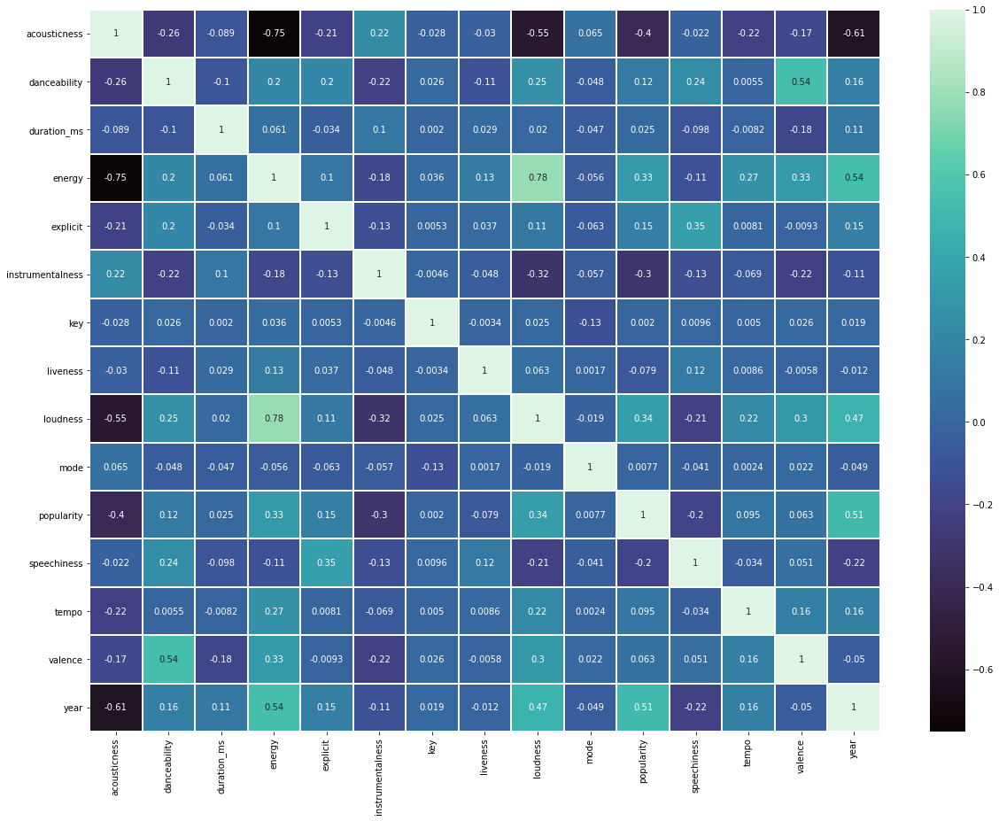

In [10]:
#HEATMAP FOR CORRELATION

plt.figure(figsize=(20,15))
sns.heatmap(df.corr(),linecolor='white',linewidths=1,cmap='mako',annot=True)
plt.show()

#Data Modelling

In [ ]:
#Applying Regression 
X= df.loc[:,df.columns!='popularity']
y= df.loc[:,df.columns=='popularity']

In [ ]:
#FeatureScaling to standardize the data
from sklearn.preprocessing import StandardScaler
sc_X= StandardScaler()
sc_y= StandardScaler()
X=sc_X.fit_transform(X)
y=sc_y.fit_transform(y)

In [ ]:
#TrainTestSplit

from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.25, random_state=0)

In [ ]:
#LINEAR REGRESSION

from sklearn.linear_model import LinearRegression
regressor_lin=LinearRegression()
regressor_lin.fit(X_train,y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [ ]:
y_pred_lin = regressor_lin.predict(X_test)

In [ ]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

In [ ]:
print("Training Score of Linear Regression is: {}\n".format(regressor_lin.score(X_train, y_train)))
print("R2 Score of Linear Regression is: {}\n".format(r2_score(y_test, y_pred_lin)))
print("Mean Squared Error of Linear Regression is: {}\n".format(mean_squared_error(y_test, y_pred_lin)))
print("Mean Absolute Error of Linear Regression is: {}\n".format(mean_absolute_error(y_test, y_pred_lin)))

Training Score of Linear Regression is: 0.8827878998573054

R2 Score of Linear Regression is: 0.8820547411577613

Mean Squared Error of Linear Regression is: 0.11783355906816692

Mean Absolute Error of Linear Regression is: 0.2897343148855848



In [ ]:
#RANDOM FOREST

from sklearn.ensemble import RandomForestRegressor
regressor_rf=RandomForestRegressor(n_estimators=300, random_state=0)
regressor_rf.fit(X_train,y_train)

y_pred_rf=regressor_rf.predict(X_test)

print("Training Score of rfear Regression is: {}\n".format(regressor_rf.score(X_train, y_train)))
print("R2 Score of rfear Regression is: {}\n".format(r2_score(y_test, y_pred_rf)))
print("Mean Squared Error of rfear Regression is: {}\n".format(mean_squared_error(y_test, y_pred_rf)))
print("Mean Absolute Error of rfear Regression is: {}\n".format(mean_absolute_error(y_test, y_pred_rf)))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



Training Score of rfear Regression is: 0.9922741980961503

R2 Score of rfear Regression is: 0.9445250274278814

Mean Squared Error of rfear Regression is: 0.05542243513259991

Mean Absolute Error of rfear Regression is: 0.17468516691323197



In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
#from sklearn.linear_model import LinearRegression

from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

In [ ]:
#ensemble technique to hit the models to the data
model_gradientboosting = GradientBoostingRegressor(random_state=42)
model_gradientboosting.fit(X_train, y_train)
y_test_pred = model_gradientboosting.predict(X_test)

rmse_gradientboosting = round(np.sqrt(mean_squared_error(y_test, y_test_pred, squared=True)), 2)
mae_gradientboosting = round(mean_absolute_error(y_test, y_test_pred), 2)
print('RMSE of gradient boosting:')
print(rmse_gradientboosting)

print('MAE of gradient boosting:')
print(mae_gradientboosting)

RMSE of gradient boosting:
0.25
MAE of gradient boosting:
0.19


In [ ]:
model_xgboost = XGBRegressor(random_state=42)
model_xgboost.fit(X_train, y_train)
y_test_pred = model_xgboost.predict(X_test)

rmse_xgboost = round(np.sqrt(mean_squared_error(y_test, y_test_pred, squared=True)), 2)
mae_xgboost = round(mean_absolute_error(y_test, y_test_pred), 2)
print('RMSE of xgboost :')
print(rmse_xgboost)

print('MAE of xgboost:')
print(mae_xgboost)

[06:25:56] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
RMSE of xgboost :
0.25
MAE of xgboost:
0.19
